# Mini-project 2: Data Preprocessing for Wine Quality Analysis

## Your Task:

Using the Wine Quality dataset, explore the following questions:

*    How do different chemical properties correlate with the quality of wine?
*    Is there a significant difference in quality between red and white wines?

# Resources

Use the Wine Quality dataset available on Kaggle for the first question and this one Red and White Wine for the second question.


# Hint

1.    Introduction to the Dataset:
*        Download the dataset from Kaggle.
*        Load the dataset using Pandas.
*        Explore the dataset by examining the columns, data types, and key statistics using functions like head(), info(), describe(), etc.

2.    Data Cleaning and Preprocessing:
*        Check for and handle missing values (e.g., using dropna() or fillna()) and detect outliers using techniques like IQR or z-scores.
*        Examine the distribution of continuous variables (e.g., using histograms or boxplots) and transform variables with high skew (e.g., using log transformations) if necessary.
*        (optional) Create new variables, such as combining pH and acidity to create an “acidity level” or grouping wines into categories based on sugar content.


# 1. Question One: How do different chemical properties correlate with the quality of wine?

## Column Descriptions

- **Fixed Acidity**: The fixed acidity of the wine, which does not evaporate during the winemaking process.
- **Volatile Acidity**: The volatile acidity that can contribute to defects in wine if present in high concentrations.
- **Citric Acid**: Citric acid, which can add freshness to the wine.
- **Residual Sugar**: The residual sugar that remains after fermentation.
- **Chlorides**: Concentration of chlorides, which can affect the taste.
- **Free Sulfur Dioxide**: Free sulfur dioxide, a preservative used in wine production.
- **Total Sulfur Dioxide**: Total sulfur dioxide, including both free and combined forms.
- **Density**: The density of the wine, which can influence its texture.
- **pH**: A measure of acidity or alkalinity of the wine.
- **Sulphates**: Sulfates, which can influence the flavor and stability of the wine.
- **Alcohol**: Percentage of alcohol in the wine.
- **Quality**: Quality rating of the wine on a scale from 0 to 10, considered a qualitative attribute.

## 1.1. EDA `Red Whine`

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np

In [2]:
path = 'Wine Quality dataset/winequality-red.csv'
df_red = pd.read_csv(path)
df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


The dataset is composed of all numeric quantitative columns, although the column `quality` could be treated as qualitative depending on the analysis.

In [3]:
df_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


We have a total of 1599 rows, without NaNs. All columns are float except for `quality`.

In [4]:
df_red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


The most important column `quality` ranges from 3 to 8, with a median of 6 and a mean of 5.6. Immediatelly we can see in the dataset there are no awfull wines, there are no excellent though.

We can check for duplicates:

In [5]:
print(f'there are a total of {df_red.duplicated().sum()} duplicated rows.')

# df_red = df_red.drop_duplicates()
# print(f'there are a total of {df_red.duplicated().sum()} duplicated rows after dropping them.')

there are a total of 240 duplicated rows.


Effectively we have duplicated values, but for this dataset we can't grant for sure its not from different samples.

We take a last view on the `quality` values:

In [6]:
df_red['quality'].value_counts()

quality
5    681
6    638
7    199
4     53
8     18
3     10
Name: count, dtype: int64

A fearly big ammount of them are in the high range, but only a few are top tier range at 8 (which is still not excellent).

## 1.2. Data Cleaning `Red Whine`

We saw already we don't have missing values, also we saw its not prudential to drop duplicates in this dataset. To deal with outliers its always better to take a look at them before simply dropping.

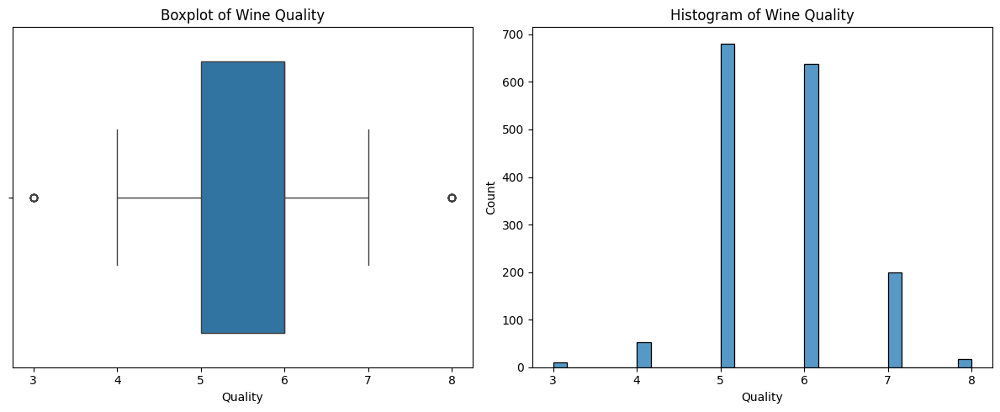

In [7]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# create the boxplot on the left subplot
sns.boxplot(x=df_red['quality'], ax=ax1)
ax1.set_title('Boxplot of Wine Quality')
ax1.set_xlabel('Quality')

# create the histplot on the right subplot
sns.histplot(x=df_red['quality'], ax=ax2)
ax2.set_title('Histogram of Wine Quality')
ax2.set_xlabel('Quality')

# adjust the layout and display the plot
plt.tight_layout()
plt.show()

We see from the boxplot that the outliers are very well defined at 3 and 8. Even though we will not use those values for our analysis for they don't follow the dataset trending, it's good to know they are there: the over-the-top premium samples and the let's say under-the-ground low grade samples.

With the quality ratings ranging from 3 to 8, and excluding the outliers, we're left with only four distinct values (4, 5, 6, 7). This limited range makes it difficult to meaningfully discuss skewness in a traditional statistical sense.

**Now** we can remove the `quality` outliers:

In [8]:
df_red_clean = df_red[(df_red['quality'] > 3) & (df_red['quality'] < 8)]

df_red_clean['quality'].describe()

count    1571.000000
mean        5.625716
std         0.745227
min         4.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         7.000000
Name: quality, dtype: float64

After removing outliers we see the `quality` std was reduced, the mean stayed at 5.6, and the mode still coincides with Q3.

We continue then to remove the outliers of the other fiels by applying the IQR method:

In [9]:
def outlier_remover(dataframe, column):
    """
    Returns a new dataframe with rows where the specified column's values fall within these bounds
    """
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return dataframe[(dataframe[column] >= lower_bound) & (dataframe[column] <= upper_bound)]

for col in df_red_clean.columns:
    df_red_clean = outlier_remover(df_red_clean, col)

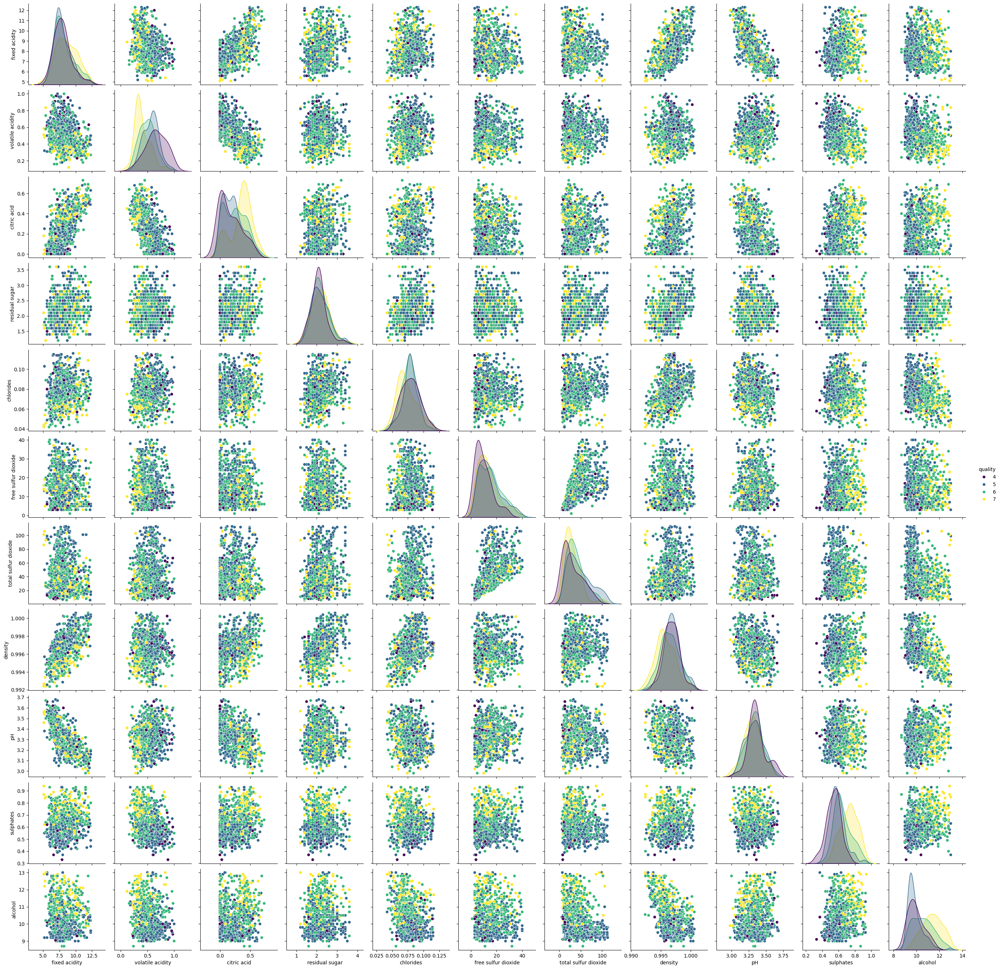

In [10]:
sns.pairplot(df_red_clean, diag_kind='kde', hue='quality', palette='viridis', diag_kws={"common_norm": False})

After removing all outliers we can see most columns are right skewed, specially `fixed acidity`, `citric acid`, `residual sugar`, `free sulfur dioxide`, `total sulfur dioxide`, `sulphates` and `alcohol`.

`fixed acidity` shows linearity with a positive correlation with `citric acid` and `density`, while (obviously) a negative one with `pH`.

`volatile acidity` shows linearity with a negative correlation with `citric acid`.

`total sulfur dioxide` shows linearity with a positive correlation with `free sulfur dioxide` in a heteroscedastic pattern.

`density` shows linearity with a positive correlation with `chlorides` in a very scattered pattern.

`alcohol` shows linearity with a negative correlation with `density` in a heteroscedastic pattern.

We proceed to transform the most skewed fields:

In [11]:
cols_to_transform = [
    'fixed acidity',
    'citric acid',
    'residual sugar',
    'free sulfur dioxide',
    'total sulfur dioxide',
    'sulphates',
    'alcohol'
]

df_red_transformed = df_red_clean.copy()

for col in cols_to_transform:
    # we use log(x + 1) for the transformation
    df_red_transformed[col] = np.log1p(df_red_transformed[col])

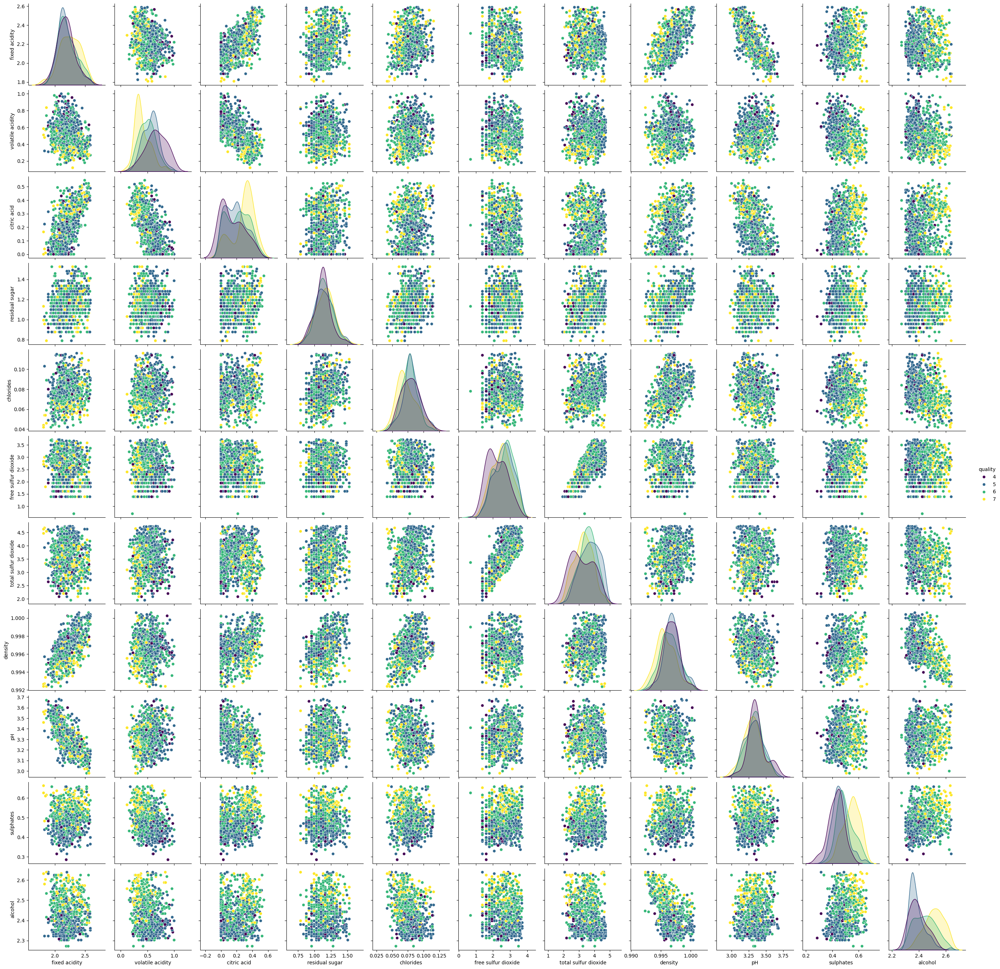

In [12]:
# all kde plots have been normalized with common_norm: False!!!!!!!!!!!!
sns.pairplot(df_red_transformed, diag_kind='kde', hue='quality', palette='viridis', diag_kws={"common_norm": False})

The log(x + 1) transformation improved the normality of many of our fields. The analyzed correlations stayed the same except for `total sulfur dioxide` and `free sulfur dioxide`, where the heteroscedasticity disappeared completely and is now a clear positive linear dependency.

So we observe that for red wines quality we need a low `volatile acidity`, while high concentrations of `citric acid`, `sulphates` and `alcohol. These features proportion don't make a high quality red wine, but it's what most our highest qiality red wines (quality = 7) have in common against the other quality levels.

# 2. Is there a significant difference in quality between red and white wines?

In [13]:
path = 'Red and White Wine/wine-quality-white-and-red.csv'
df_white_red = pd.read_csv(path)
df_white_red.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


Since we already have the red wines dataframe, we will take only the type == white (yes, the type == red are the same rows we already analyzed previously) rows and repeat the EDA:

In [14]:
# df_white = df_white[df_white['type'] == 'white']
# df_white = df_white.drop('type', axis=1)

In [15]:
print('info:')
print(df_white_red.info())
print('\n------------------------\n')
print('describe')
print(df_white_red[df_white_red['type']=='white'].describe())

info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6497 non-null   float64
 2   volatile acidity      6497 non-null   float64
 3   citric acid           6497 non-null   float64
 4   residual sugar        6497 non-null   float64
 5   chlorides             6497 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6497 non-null   float64
 10  sulphates             6497 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB
None

------------------------

describe
       fixed aci

No null values, and we can see also an increase in the maximum quality value for the white wine type. Also we can appreciate a bigger sample population, which *could in principle* mean a bigger variety of white wines (at least in our dataset).

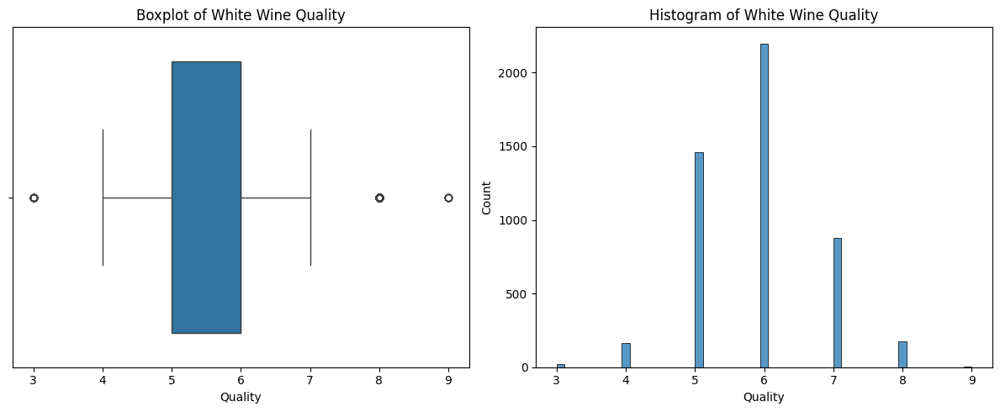

In [16]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# create the boxplot on the left subplot
sns.boxplot(x='quality', data=df_white_red[df_white_red['type']=='white'], ax=ax1)
ax1.set_title('Boxplot of White Wine Quality')
ax1.set_xlabel('Quality')

# create the histplot on the right subplot
sns.histplot(x='quality', data=df_white_red[df_white_red['type']=='white'], ax=ax2)
ax2.set_title('Histogram of White Wine Quality')
ax2.set_xlabel('Quality')

# adjust the layout and display the plot
plt.tight_layout()
plt.show()

We remove outliers, and from the boxplot we see its the same range for white wine

In [17]:
df_white_red_clean = df_white_red[(df_white_red['quality'] > 3) & (df_white_red['quality'] < 8)]

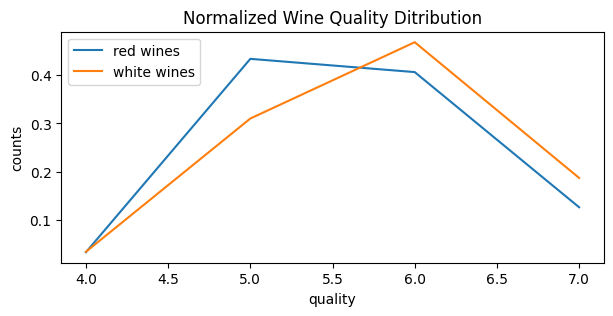

type     red  white  red_normalized  white_normalized
quality                                              
4         53    163        0.033736          0.034696
5        681   1457        0.433482          0.310132
6        638   2198        0.406111          0.467859
7        199    880        0.126671          0.187314
----------------------------------------------------------------
stats


type,red,white,red_normalized,white_normalized
count,4.000000,4.000000,4.000000,4.000000
mean,392.750000,1174.500000,0.250000,0.250000
std,314.221127,863.562582,0.200013,0.183815
min,53.000000,163.000000,0.033736,0.034696
25%,162.500000,700.750000,0.103437,0.149159
50%,418.500000,1168.500000,0.266391,0.248723
75%,648.750000,1642.250000,0.412954,0.349564
max,681.000000,2198.000000,0.433482,0.467859


In [18]:
# we group by type and separate by quality
grouped_types = (df_white_red_clean.groupby('type')['quality'].value_counts().unstack(fill_value=0).T.sort_index()).copy()

# need normalicing
grouped_types['red_normalized'] = grouped_types['red'] / grouped_types['red'].sum()
grouped_types['white_normalized'] = grouped_types['white'] / grouped_types['white'].sum()


# plot the figure
plt.figure(figsize=(7,3))

sns.lineplot(x='quality', y='red_normalized', data=grouped_types, label='red wines')
sns.lineplot(x='quality', y='white_normalized', data=grouped_types, label='white wines')

plt.title('Normalized Wine Quality Ditribution')
plt.ylabel('counts')
plt.show()

print(grouped_types)
print('----------------------------------------------------------------')
print('stats')
grouped_types.describe()

We can verify effectively that, for the dataset, white wines quality is in general over red wine quality. Not only from the normalized distributions, but also the white wine outliers are a level above.